In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision.utils import save_image

from tqdm import tqdm
import os

# --- Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {DEVICE}")

LEARNING_RATE = 3e-4
BATCH_SIZE = 32
NUM_EPOCHS = 50
IMAGE_SIZE = 256 

# VQ-VAE-2 Hyperparameters
# Bottom level (high resolution details)
EMBEDDING_DIM_BOTTOM = 64
NUM_EMBEDDINGS_BOTTOM = 256
# Top level (global structure)
EMBEDDING_DIM_TOP = 32
NUM_EMBEDDINGS_TOP = 256

COMMITMENT_COST = 0.25

# Create output directory
os.makedirs("vq_vae2_results", exist_ok=True)


# --- Core VQ-VAE Modules ---

class VectorQuantizer(nn.Module):
    """
    The core Vector Quantizer (VQ) layer.
    """
    def __init__(self, num_embeddings, embedding_dim, commitment_cost):
        super(VectorQuantizer, self).__init__()
        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim
        self.commitment_cost = commitment_cost
        
        self.embedding = nn.Embedding(self.num_embeddings, self.embedding_dim)
        self.embedding.weight.data.uniform_(-1.0 / self.num_embeddings, 1.0 / self.num_embeddings)

    def forward(self, z_e):
        # z_e shape: (B, C, H, W)
        B, C, H, W = z_e.shape
        z_e_flat = z_e.permute(0, 2, 3, 1).contiguous().view(-1, self.embedding_dim)
        
        # Calculate distances
        distances = torch.sum(z_e_flat**2, dim=1, keepdim=True) + \
                    torch.sum(self.embedding.weight**2, dim=1) - \
                    2 * torch.matmul(z_e_flat, self.embedding.weight.t())
        
        # Get nearest embeddings
        min_encoding_indices = torch.argmin(distances, dim=1)
        z_q = self.embedding(min_encoding_indices)
        
        # Reshape back
        z_q_reshaped = z_q.view(B, H, W, C)
        z_e_permuted = z_e.permute(0, 2, 3, 1)
        
        # Straight-through estimator
        z_q_ste = z_e_permuted + (z_q_reshaped - z_e_permuted).detach()
        
        # VQ losses
        loss_e = F.mse_loss(z_q, z_e_flat.detach())
        loss_c = F.mse_loss(z_e_flat, z_q.detach())
        vq_loss = loss_e + self.commitment_cost * loss_c
        
        # Back to (B, C, H, W)
        z_q_ste = z_q_ste.permute(0, 3, 1, 2).contiguous()
        
        return z_q_ste, vq_loss, min_encoding_indices


class ResidualBlock(nn.Module):
    """
    Residual block with two convolutional layers.
    """
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReLU(inplace=False),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=1, stride=1)
        )
    
    def forward(self, x):
        return x + self.block(x)


class EncoderBlock(nn.Module):
    """
    Encoder block that downsamples and processes features.
    """
    def __init__(self, in_channels, out_channels, num_res_blocks):
        super(EncoderBlock, self).__init__()
        
        layers = []
        # Downsample
        layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1))
        layers.append(nn.ReLU(inplace=False))
        
        # Residual blocks
        for _ in range(num_res_blocks):
            layers.append(ResidualBlock(out_channels, out_channels))
        
        self.block = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    """
    Decoder block that upsamples and processes features.
    """
    def __init__(self, in_channels, out_channels, num_res_blocks):
        super(DecoderBlock, self).__init__()
        
        layers = []
        # Residual blocks
        for _ in range(num_res_blocks):
            layers.append(ResidualBlock(in_channels, in_channels))
        
        # Upsample
        layers.append(nn.ReLU(inplace=False))
        layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1))
        
        self.block = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.block(x)


class HierarchicalEncoder(nn.Module):
    """
    Hierarchical encoder that produces two levels of latent codes:
    - Bottom level: high-resolution details (32x32 for 128x128 input)
    - Top level: global structure (16x16 for 128x128 input)
    """
    def __init__(self, in_channels=3):
        super(HierarchicalEncoder, self).__init__()
        
        # Initial conv
        self.conv_in = nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1)
        
        # Encoder levels
        self.enc1 = EncoderBlock(64, 128, num_res_blocks=2)    # 128x128 -> 64x64
        self.enc2 = EncoderBlock(128, 256, num_res_blocks=2)   # 64x64 -> 32x32
        self.enc3 = EncoderBlock(256, 256, num_res_blocks=2)   # 32x32 -> 16x16
        
        # Output convolutions for quantization
        self.conv_bottom = nn.Conv2d(256, EMBEDDING_DIM_BOTTOM, kernel_size=1)  # 32x32
        self.conv_top = nn.Conv2d(256, EMBEDDING_DIM_TOP, kernel_size=1)        # 16x16
        
    def forward(self, x):
        x = F.relu(self.conv_in(x))
        x = self.enc1(x)           # 64x64
        x_bottom = self.enc2(x)    # 32x32 - bottom level
        x_top = self.enc3(x_bottom) # 16x16 - top level
        
        z_e_bottom = self.conv_bottom(x_bottom)
        z_e_top = self.conv_top(x_top)
        
        return z_e_bottom, z_e_top


class HierarchicalDecoder(nn.Module):
    """
    Hierarchical decoder that reconstructs from both levels of latent codes.
    The top level is upsampled and combined with the bottom level.
    """
    def __init__(self, out_channels=3):
        super(HierarchicalDecoder, self).__init__()
        
        # Process top level
        self.conv_top_in = nn.Conv2d(EMBEDDING_DIM_TOP, 256, kernel_size=1)
        
        # Upsample top to match bottom resolution
        self.upsample_top = nn.Sequential(
            ResidualBlock(256, 256),
            nn.ReLU(inplace=False),
            nn.ConvTranspose2d(256, 256, kernel_size=4, stride=2, padding=1)  # 16x16 -> 32x32
        )
        
        # Combine top and bottom
        self.conv_combine = nn.Conv2d(EMBEDDING_DIM_BOTTOM + 256, 256, kernel_size=1)
        
        # Decoder levels
        self.dec1 = DecoderBlock(256, 128, num_res_blocks=2)  # 32x32 -> 64x64
        self.dec2 = DecoderBlock(128, 64, num_res_blocks=2)   # 64x64 -> 128x128
        
        # Final output
        self.conv_out = nn.Sequential(
            nn.ReLU(inplace=False),
            nn.Conv2d(64, out_channels, kernel_size=3, stride=1, padding=1)
        )
        
    def forward(self, z_q_bottom, z_q_top):
        # Process and upsample top level
        x_top = self.conv_top_in(z_q_top)
        x_top_up = self.upsample_top(x_top)  # Now 32x32
        
        # Combine with bottom level
        x_combined = torch.cat([z_q_bottom, x_top_up], dim=1)
        x = self.conv_combine(x_combined)
        
        # Decode
        x = self.dec1(x)
        x = self.dec2(x)
        x_recon = self.conv_out(x)
        
        return torch.tanh(x_recon)


class VQVAE2(nn.Module):
    """
    VQ-VAE-2: Hierarchical Vector Quantized Variational AutoEncoder.
    Uses two levels of quantization for better quality.
    """
    def __init__(self):
        super(VQVAE2, self).__init__()
        
        self.encoder = HierarchicalEncoder()
        
        self.quantizer_bottom = VectorQuantizer(
            NUM_EMBEDDINGS_BOTTOM, 
            EMBEDDING_DIM_BOTTOM, 
            COMMITMENT_COST
        )
        
        self.quantizer_top = VectorQuantizer(
            NUM_EMBEDDINGS_TOP, 
            EMBEDDING_DIM_TOP, 
            COMMITMENT_COST
        )
        
        self.decoder = HierarchicalDecoder()
    
    def forward(self, x):
        # Encode to two levels
        z_e_bottom, z_e_top = self.encoder(x)
        
        # Quantize both levels
        z_q_bottom, vq_loss_bottom, _ = self.quantizer_bottom(z_e_bottom)
        z_q_top, vq_loss_top, _ = self.quantizer_top(z_e_top)
        
        # Decode from both levels
        x_recon = self.decoder(z_q_bottom, z_q_top)
        
        # Total VQ loss
        vq_loss = vq_loss_bottom + vq_loss_top
        
        return x_recon, vq_loss

    def encode_indices(self, x):
        """Get quantized indices for an image"""
        z_e_bottom, z_e_top = self.encoder(x)
        _, _, indices_bottom = self.quantizer_bottom(z_e_bottom)
        _, _, indices_top = self.quantizer_top(z_e_top)
        
        # Reshape to 2D grids
        B = x.size(0)
        indices_bottom = indices_bottom.view(B, BOTTOM_SIZE, BOTTOM_SIZE)
        indices_top = indices_top.view(B, TOP_SIZE, TOP_SIZE)
        
        return indices_top, indices_bottom

Using device: cuda


In [2]:
# --- Data Loading (ImageNet) ---

import urllib.request
import tarfile

def download_imagenette(data_dir='./data'):
    """
    Download and extract ImageNette dataset if not already present.
    ImageNette is a subset of ImageNet with 10 easily classified classes.
    """
    imagenette_path = os.path.join(data_dir, 'imagenette2')
    
    if os.path.exists(imagenette_path):
        print(f"ImageNette already exists at {imagenette_path}")
        return imagenette_path
    
    print("Downloading ImageNette dataset (1.4 GB)...")
    os.makedirs(data_dir, exist_ok=True)
    
    url = "https://s3.amazonaws.com/fast-ai-imageclas/imagenette2.tgz"
    tar_path = os.path.join(data_dir, 'imagenette2.tgz')
    
    # Download with progress bar
    def reporthook(count, block_size, total_size):
        percent = int(count * block_size * 100 / total_size)
        print(f"\rDownloading: {percent}%", end='')
    
    urllib.request.urlretrieve(url, tar_path, reporthook)
    print("\nDownload complete! Extracting...")
    
    # Extract
    with tarfile.open(tar_path, 'r:gz') as tar:
        tar.extractall(data_dir)
    
    # Clean up tar file
    os.remove(tar_path)
    print(f"ImageNette extracted to {imagenette_path}")
    
    return imagenette_path

# Download ImageNette if needed
imagenette_root = download_imagenette()

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

print("Loading ImageNette dataset...")
train_dataset = datasets.ImageFolder(root=os.path.join(imagenette_root, 'train'), transform=transform)
test_dataset = datasets.ImageFolder(root=os.path.join(imagenette_root, 'val'), transform=transform)

print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(test_dataset)}")
print(f"Number of classes: {len(train_dataset.classes)}")


train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    num_workers=4, 
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=4
)

# Get fixed samples for visualization
try:
    fixed_images, _ = next(iter(test_loader))
    fixed_images = fixed_images.to(DEVICE)
    save_image(fixed_images * 0.5 + 0.5, 'vq_vae2_results/real_samples.png', nrow=8)
except:
    print("Could not save real samples")


model = VQVAE2().to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)

print(f"Model parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

ImageNette already exists at ./data/imagenette2
Loading ImageNette dataset...
Training samples: 9471
Validation samples: 3925
Number of classes: 10
Model parameters: 8,799,843


In [4]:
# --- Training Loop ---

print("Starting VQ-VAE-2 training...")

for epoch in range(NUM_EPOCHS):
    model.train()
    loop = tqdm(enumerate(train_loader), total=len(train_loader), leave=False)
    loop.set_description(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")
    
    epoch_recon_loss = 0
    epoch_vq_loss = 0
    
    for i, (images, _) in loop:
        images = images.to(DEVICE)
        
        # Forward pass
        x_recon, vq_loss = model(images)
        
        # Calculate losses
        recon_loss = F.mse_loss(x_recon, images)
        total_loss = recon_loss + vq_loss
        
        # Backward pass
        optimizer.zero_grad()
        total_loss.backward()
        
        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        optimizer.step()
        
        epoch_recon_loss += recon_loss.item()
        epoch_vq_loss += vq_loss.item()
        
        if (i+1) % 50 == 0:
            loop.set_postfix(
                total_loss=total_loss.item(),
                recon_loss=recon_loss.item(),
                vq_loss=vq_loss.item(),
                lr=optimizer.param_groups[0]['lr']
            )
    
    # Update learning rate
    scheduler.step()
    
    # Print epoch statistics
    avg_recon = epoch_recon_loss / len(train_loader)
    avg_vq = epoch_vq_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{NUM_EPOCHS} - Recon Loss: {avg_recon:.4f}, VQ Loss: {avg_vq:.4f}")
    
    # Evaluation and sampling
    if (epoch + 1) % 5 == 0 or epoch == 0:
        model.eval()
        with torch.no_grad():
            try:
                # Reconstruct fixed batch
                recon_images, _ = model(fixed_images)
                recon_images = recon_images.cpu() * 0.5 + 0.5
                save_image(recon_images, f'vq_vae2_results/recon_epoch_{epoch+1}.png', nrow=8)
            except:
                print(f"Could not save reconstruction for epoch {epoch+1}")
        
        # Save checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
        }, f'vq_vae2_results/checkpoint_epoch_{epoch+1}.pt')

print(f"Training finished! Total time={time.time()-start_time}")
print("Check the 'vq_vae2_results' directory for outputs.")
print("\nTo use this model:")
print("1. Download ImageNette from https://github.com/fastai/imagenette")
print("2. Extract to ./data/imagenet/ with train/ and val/ subdirectories")
print("3. Or modify the dataset loading section to use your own ImageNet subset")

Starting VQ-VAE-2 training...


Epoch 1/50 - Recon Loss: 0.2056, VQ Loss: 467.7628


Epoch 2/50 - Recon Loss: 0.1315, VQ Loss: 133.4149


Epoch 3/50 - Recon Loss: 0.0515, VQ Loss: 0.4244


Epoch 4/50 - Recon Loss: 0.0259, VQ Loss: 0.0729


Epoch 5/50 - Recon Loss: 0.0199, VQ Loss: 0.0328


Epoch 6/50 - Recon Loss: 0.0163, VQ Loss: 0.0294


Epoch 7/50 - Recon Loss: 0.0134, VQ Loss: 0.0216


Epoch 8/50 - Recon Loss: 0.0128, VQ Loss: 0.0181


Epoch 9/50 - Recon Loss: 0.0120, VQ Loss: 0.0163


Epoch 10/50 - Recon Loss: 0.0116, VQ Loss: 0.0157


Epoch 11/50 - Recon Loss: 0.0113, VQ Loss: 0.0150


Epoch 12/50 - Recon Loss: 0.0116, VQ Loss: 0.0154


Epoch 13/50 - Recon Loss: 0.0109, VQ Loss: 0.0148


Epoch 14/50 - Recon Loss: 0.0107, VQ Loss: 0.0146


Epoch 15/50 - Recon Loss: 0.0107, VQ Loss: 0.0146


Epoch 16/50 - Recon Loss: 0.0104, VQ Loss: 0.0144


Epoch 17/50 - Recon Loss: 0.0102, VQ Loss: 0.0144


Epoch 18/50 - Recon Loss: 0.0101, VQ Loss: 0.0144


Epoch 19/50 - Recon Loss: 0.0102, VQ Loss: 0.0145


Epoch 20/50 - Recon Loss: 0.0101, VQ Loss: 0.0146


Epoch 21/50 - Recon Loss: 0.0099, VQ Loss: 0.0145


Epoch 22/50 - Recon Loss: 0.0098, VQ Loss: 0.0145


Epoch 23/50 - Recon Loss: 0.0097, VQ Loss: 0.0146


Epoch 24/50 - Recon Loss: 0.0096, VQ Loss: 0.0147


Epoch 25/50 - Recon Loss: 0.0094, VQ Loss: 0.0142


Epoch 26/50 - Recon Loss: 0.0093, VQ Loss: 0.0136


Epoch 27/50 - Recon Loss: 0.0092, VQ Loss: 0.0136


Epoch 28/50 - Recon Loss: 0.0091, VQ Loss: 0.0137


Epoch 29/50 - Recon Loss: 0.0090, VQ Loss: 0.0134


Epoch 30/50 - Recon Loss: 0.0089, VQ Loss: 0.0134


Epoch 31/50 - Recon Loss: 0.0088, VQ Loss: 0.0131


Epoch 32/50 - Recon Loss: 0.0086, VQ Loss: 0.0135


Epoch 33/50 - Recon Loss: 0.0085, VQ Loss: 0.0135


Epoch 34/50 - Recon Loss: 0.0086, VQ Loss: 0.0134


Epoch 35/50 - Recon Loss: 0.0083, VQ Loss: 0.0131


Epoch 36/50 - Recon Loss: 0.0082, VQ Loss: 0.0129


Epoch 37/50 - Recon Loss: 0.0081, VQ Loss: 0.0127


Epoch 38/50 - Recon Loss: 0.0080, VQ Loss: 0.0130


Epoch 39/50 - Recon Loss: 0.0079, VQ Loss: 0.0124


Epoch 40/50 - Recon Loss: 0.0079, VQ Loss: 0.0124


Epoch 41/50 - Recon Loss: 0.0079, VQ Loss: 0.0124


Epoch 42/50 - Recon Loss: 0.0078, VQ Loss: 0.0124


Epoch 43/50 - Recon Loss: 0.0078, VQ Loss: 0.0123


Epoch 44/50 - Recon Loss: 0.0078, VQ Loss: 0.0123


Epoch 45/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


Epoch 46/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


Epoch 47/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


Epoch 48/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


Epoch 49/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


Epoch 50/50 - Recon Loss: 0.0077, VQ Loss: 0.0123


NameError: name 'time' is not defined

In [3]:
import time
import numpy as np

# --- Configuration for Sampling ---
NUM_SAMPLES = 64  # Number of images to generate (must be a square number for a clean grid, e.g., 64=8x8)
# If your model was trained on a different epoch, change the checkpoint file name below.
CHECKPOINT_FILE = 'vq_vae2_results/checkpoint_epoch_50.pt'

checkpoint = torch.load(CHECKPOINT_FILE, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded model checkpoint from {CHECKPOINT_FILE}")

/scratch/2041685.1.l40s/ipykernel_3964742/3055644093.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CHECKPOINT_FILE, map_location=DEVICE)


Loaded model checkpoint from vq_vae2_results/checkpoint_epoch_50.pt


Showing basic reconstructions...


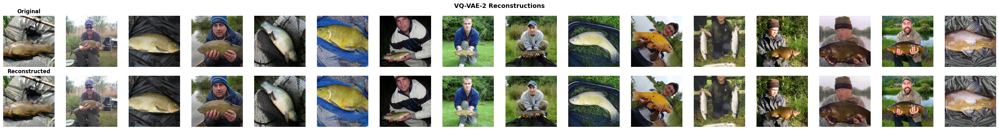


Showing large side-by-side comparison...


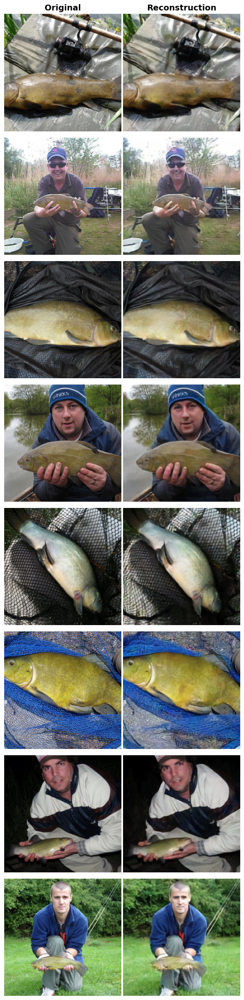


Showing reconstructions by class...
✓ Collected all samples!
Found samples for 10/10 classes
  n01440764: 4 samples
  n02102040: 4 samples
  n02979186: 4 samples
  n03000684: 4 samples
  n03028079: 4 samples
  n03394916: 4 samples
  n03417042: 4 samples
  n03425413: 4 samples
  n03445777: 4 samples
  n03888257: 4 samples


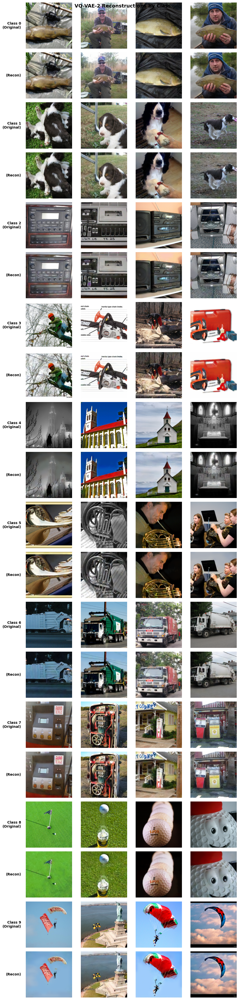


Calculating quality metrics...


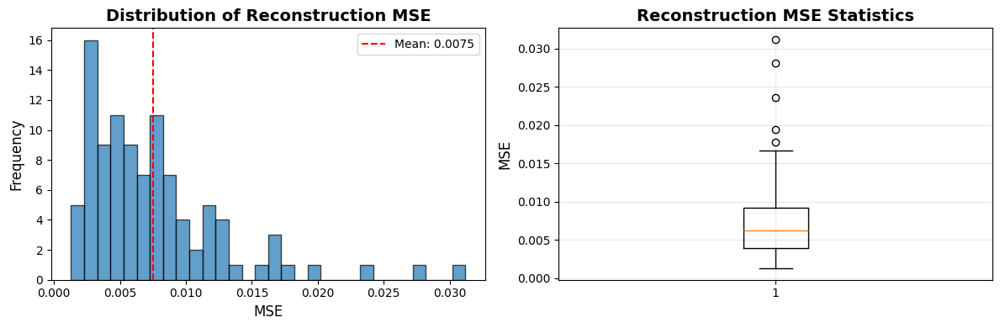

Reconstruction Quality Metrics (n=100):
  Mean MSE: 0.007535
  Std MSE:  0.005351
  Min MSE:  0.001290
  Max MSE:  0.031182

Showing more samples (32 total)...


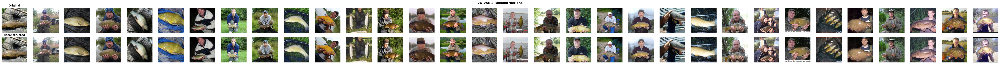

In [4]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# --- Visualization Functions ---

def denormalize(images):
    """Convert from [-1, 1] to [0, 1] for display"""
    return images * 0.5 + 0.5

def show_reconstructions(model, test_loader, device, num_samples=16):
    """
    Show original vs reconstructed images in a grid.
    """
    model.eval()
    
    # Get a batch of test images
    images, labels = next(iter(test_loader))
    images = images[:num_samples].to(device)
    
    with torch.no_grad():
        reconstructions, _ = model(images)
    
    # Move to CPU and denormalize
    images = denormalize(images.cpu())
    reconstructions = denormalize(reconstructions.cpu())
    
    # Create figure
    fig, axes = plt.subplots(2, num_samples, figsize=(num_samples * 2, 4))
    
    for i in range(num_samples):
        # Original images
        axes[0, i].imshow(images[i].permute(1, 2, 0).numpy())
        axes[0, i].axis('off')
        if i == 0:
            axes[0, i].set_title('Original', fontsize=12, fontweight='bold')
        
        # Reconstructed images
        axes[1, i].imshow(reconstructions[i].permute(1, 2, 0).numpy())
        axes[1, i].axis('off')
        if i == 0:
            axes[1, i].set_title('Reconstructed', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.suptitle('VQ-VAE-2 Reconstructions', fontsize=14, fontweight='bold', y=1.02)
    plt.show()


def show_reconstructions_by_class(model, test_loader, device, num_per_class=4):
    """
    Show reconstructions organized by class.
    """
    model.eval()
    
    # Collect images by class
    class_images = defaultdict(list)
    class_names = test_loader.dataset.classes
    num_classes_total = len(class_names)
    
    # Initialize with empty lists for all classes
    for i in range(num_classes_total):
        class_images[i] = []
    
    # Collect samples from all classes
    print(f"Collecting {num_per_class} samples from each of {num_classes_total} classes...")
    for images, labels in test_loader:
        for img, label in zip(images, labels):
            label_idx = label.item()
            if len(class_images[label_idx]) < num_per_class:
                class_images[label_idx].append(img)
        
        # Check if we have enough samples for all classes
        if all(len(imgs) >= num_per_class for imgs in class_images.values()):
            print("✓ Collected all samples!")
            break
    
    # Check which classes we have
    collected_classes = [i for i in range(num_classes_total) if len(class_images[i]) > 0]
    num_classes = len(collected_classes)
    
    print(f"Found samples for {num_classes}/{num_classes_total} classes")
    for i in collected_classes:
        print(f"  {class_names[i]}: {len(class_images[i])} samples")
    
    # Create figure: each class gets 2 rows (original + reconstruction)
    fig, axes = plt.subplots(num_classes * 2, num_per_class, 
                             figsize=(num_per_class * 2.5, num_classes * 4))
    
    if num_classes == 1:
        axes = axes.reshape(2, -1)
    
    for plot_idx, class_idx in enumerate(collected_classes):
        # Get images for this class
        num_available = len(class_images[class_idx])
        num_to_show = min(num_available, num_per_class)
        
        if num_to_show == 0:
            continue
            
        images_tensor = torch.stack(class_images[class_idx][:num_to_show]).to(device)
        
        with torch.no_grad():
            reconstructions, _ = model(images_tensor)
        
        # Denormalize
        images_tensor = denormalize(images_tensor.cpu())
        reconstructions = denormalize(reconstructions.cpu())
        
        for i in range(num_to_show):
            # Original
            row_orig = plot_idx * 2
            axes[row_orig, i].imshow(images_tensor[i].permute(1, 2, 0).numpy())
            axes[row_orig, i].axis('off')
            if i == 0:
                class_name = class_names[class_idx]
                # Simplify class name if it's a WordNet ID
                if class_name.startswith('n'):
                    class_display = f"Class {class_idx}"
                else:
                    class_display = class_name
                axes[row_orig, i].text(-0.1, 0.5, f'{class_display}\n(Original)', 
                                       transform=axes[row_orig, i].transAxes,
                                       fontsize=10, fontweight='bold',
                                       verticalalignment='center',
                                       horizontalalignment='right')
            
            # Reconstruction
            row_recon = plot_idx * 2 + 1
            axes[row_recon, i].imshow(reconstructions[i].permute(1, 2, 0).numpy())
            axes[row_recon, i].axis('off')
            if i == 0:
                axes[row_recon, i].text(-0.1, 0.5, '(Recon)', 
                                        transform=axes[row_recon, i].transAxes,
                                        fontsize=10, fontweight='bold',
                                        verticalalignment='center',
                                        horizontalalignment='right')
        
        # Hide unused subplots if we have fewer samples than requested
        for i in range(num_to_show, num_per_class):
            axes[plot_idx * 2, i].axis('off')
            axes[plot_idx * 2 + 1, i].axis('off')
    
    plt.tight_layout()
    plt.suptitle('VQ-VAE-2 Reconstructions by Class', fontsize=14, fontweight='bold', y=0.995)
    plt.show()


def show_large_comparison(model, test_loader, device, num_samples=8):
    """
    Show large side-by-side comparison of originals and reconstructions.
    """
    model.eval()
    
    images, labels = next(iter(test_loader))
    images = images[:num_samples].to(device)
    
    with torch.no_grad():
        reconstructions, _ = model(images)
    
    # Denormalize
    images = denormalize(images.cpu())
    reconstructions = denormalize(reconstructions.cpu())
    
    # Create side-by-side pairs
    fig, axes = plt.subplots(num_samples, 2, figsize=(6, num_samples * 3))
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        # Original
        axes[i, 0].imshow(images[i].permute(1, 2, 0).numpy())
        axes[i, 0].axis('off')
        if i == 0:
            axes[i, 0].set_title('Original', fontsize=14, fontweight='bold')
        
        # Reconstruction
        axes[i, 1].imshow(reconstructions[i].permute(1, 2, 0).numpy())
        axes[i, 1].axis('off')
        if i == 0:
            axes[i, 1].set_title('Reconstruction', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()


def show_quality_metrics(model, test_loader, device, num_samples=100):
    """
    Calculate and display reconstruction quality metrics.
    """
    model.eval()
    
    mse_scores = []
    
    with torch.no_grad():
        for i, (images, _) in enumerate(test_loader):
            if i * test_loader.batch_size >= num_samples:
                break
            
            images = images.to(device)
            reconstructions, _ = model(images)
            
            # Calculate MSE per image
            mse = ((images - reconstructions) ** 2).mean(dim=[1, 2, 3])
            mse_scores.extend(mse.cpu().numpy())
    
    mse_scores = np.array(mse_scores[:num_samples])
    
    # Plot histogram
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    ax1.hist(mse_scores, bins=30, edgecolor='black', alpha=0.7)
    ax1.set_xlabel('MSE', fontsize=12)
    ax1.set_ylabel('Frequency', fontsize=12)
    ax1.set_title('Distribution of Reconstruction MSE', fontsize=14, fontweight='bold')
    ax1.axvline(mse_scores.mean(), color='red', linestyle='--', label=f'Mean: {mse_scores.mean():.4f}')
    ax1.legend()
    
    # Box plot
    ax2.boxplot(mse_scores, vert=True)
    ax2.set_ylabel('MSE', fontsize=12)
    ax2.set_title('Reconstruction MSE Statistics', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Reconstruction Quality Metrics (n={num_samples}):")
    print(f"  Mean MSE: {mse_scores.mean():.6f}")
    print(f"  Std MSE:  {mse_scores.std():.6f}")
    print(f"  Min MSE:  {mse_scores.min():.6f}")
    print(f"  Max MSE:  {mse_scores.max():.6f}")


# --- Usage Examples ---

# 1. Basic reconstruction comparison (16 samples)
print("Showing basic reconstructions...")
show_reconstructions(model, test_loader, DEVICE, num_samples=16)

# 2. Large side-by-side comparison
print("\nShowing large side-by-side comparison...")
show_large_comparison(model, test_loader, DEVICE, num_samples=8)

# 3. Reconstructions organized by class
print("\nShowing reconstructions by class...")
show_reconstructions_by_class(model, test_loader, DEVICE, num_per_class=4)

# 4. Quality metrics
print("\nCalculating quality metrics...")
show_quality_metrics(model, test_loader, DEVICE, num_samples=100)

# 5. Even more samples in a grid
print("\nShowing more samples (32 total)...")
show_reconstructions(model, test_loader, DEVICE, num_samples=32)

Testing Top-Only Decoding...


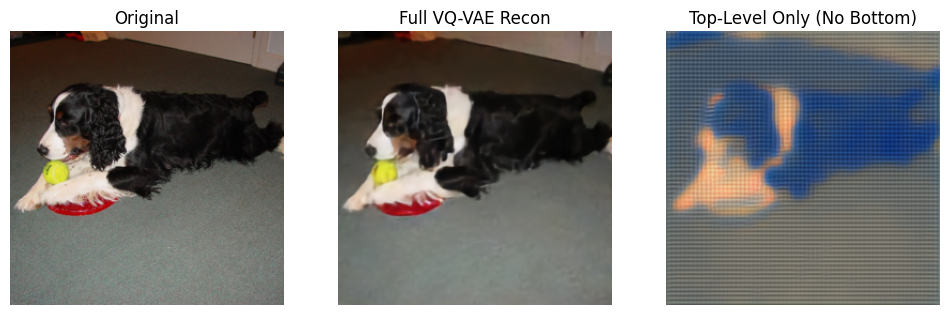

Saved comparison to top_level_ablation.png


<Figure size 640x480 with 0 Axes>

In [33]:
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import os

# --- Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
VQVAE_CHECKPOINT = 'vq_vae2_results/checkpoint_epoch_50.pt' # Ensure this matches your path
IMAGE_PATH = './data/imagenette2/train/n02102040/ILSVRC2012_val_00002294.JPEG' # Pick any image path
# Dimensions based on your code (256 input -> 64x64 bottom -> 32x32 top)
BOTTOM_RES = 64 

def load_image(path):
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    img = Image.open(path).convert('RGB')
    return transform(img).unsqueeze(0).to(DEVICE)

def decode_top_only():
    print("Testing Top-Only Decoding...")
    
    # 1. Load Model
    # (Assuming VQVAE2 class is defined/imported above)
    vqvae = VQVAE2().to(DEVICE)
    if os.path.exists(VQVAE_CHECKPOINT):
        checkpoint = torch.load(VQVAE_CHECKPOINT, map_location=DEVICE, weights_only=False)
        state_dict = checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint
        # Remove 'module.' prefix if DDP was used
        new_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
        vqvae.load_state_dict(new_state_dict)
    vqvae.eval()

    # 2. Get Real Image
    real_img = load_image(IMAGE_PATH)

    with torch.no_grad():
        # 3. Encode to get Real Z_top
        z_e_bottom, z_e_top = vqvae.encoder(real_img)
        
        # Quantize Top (Standard)
        # Returns: (z_q, loss, indices)
        z_q_top, _, _ = vqvae.quantizer_top(z_e_top)
        
        # 4. Create "Dead" Bottom Code
        # The decoder expects bottom codes to be concatenated with upsampled top codes.
        # Bottom resolution is 64x64. Embedding dim is 64.
        # Shape: (Batch, Channels, H, W)
        zeros_bottom = torch.zeros(1, EMBEDDING_DIM_BOTTOM, BOTTOM_RES, BOTTOM_RES).to(DEVICE)
        
        # 5. Decode using (Zeros, Real Top)
        # The decoder will upsample Top to 64x64, concat with Zeros, and decode.
        recon_top_only = vqvae.decoder(zeros_bottom, z_q_top)
        
        # 6. Also get Full Reconstruction for comparison
        z_q_bottom, _, _ = vqvae.quantizer_bottom(z_e_bottom)
        recon_full = vqvae.decoder(z_q_bottom, z_q_top)

    # 7. Visualize
    def denorm(x): return (x + 1) / 2
    
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(denorm(real_img[0]).cpu().permute(1, 2, 0).clamp(0,1))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Full VQ-VAE Recon")
    plt.imshow(denorm(recon_full[0]).cpu().permute(1, 2, 0).clamp(0,1))
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.title("Top-Level Only (No Bottom)")
    plt.imshow(denorm(recon_top_only[0]).cpu().permute(1, 2, 0).clamp(0,1))
    plt.axis('off')

    plt.show()
    plt.savefig('top_level_ablation.png')
    print("Saved comparison to top_level_ablation.png")

if __name__ == "__main__":
    decode_top_only()

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.nn.parallel import DistributedDataParallel as DDP
import torch.distributed as dist
import torch.multiprocessing as mp
from tqdm import tqdm
import os
import math

# --- Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# Training hyperparameters
LEARNING_RATE = 3e-4
BATCH_SIZE = 32      # Increased batch size since we have way less memory usage!
ACCUM_STEPS = 1      # Likely don't need accumulation anymore
NUM_EPOCHS = 500     # You will see results in < 10 epochs
GRAD_CLIP = 1.0

# Model hyperparameters
D_MODEL = 512
N_HEADS = 8
N_LAYERS = 15        # Slightly reduced layers for speed (12 is standard GPT-2 Small)
D_FF = 2048
DROPOUT = 0.1

# VQ-VAE Settings
IMAGE_SIZE = 256
EMBEDDING_DIM_TOP = 32
NUM_EMBEDDINGS_TOP = 256
TOP_SIZE = 32
VQVAE_CHECKPOINT = 'vq_vae2_results/checkpoint_epoch_50.pt'

# Output directory
os.makedirs("transformer_top_only_results", exist_ok=True)
DTYPE = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16

# --- Classes (VQVAE2, ResidualBlock, etc.) ---
# ... (Paste your VQVAE2 classes here or import them) ...
# For brevity, I assume VQVAE2 is defined as in your previous scripts.

# --- Causal Self Attention (Optimized) ---
class CausalSelfAttention(nn.Module):
    def __init__(self, d_model, n_heads, dropout):
        super().__init__()
        assert d_model % n_heads == 0
        self.head_dim = d_model // n_heads
        self.n_heads = n_heads
        
        self.c_attn = nn.Linear(d_model, 3 * d_model)
        self.c_proj = nn.Linear(d_model, d_model)
        self.dropout_val = dropout
        
    def forward(self, x, layer_past=None):
        B, T, C = x.size()
        qkv = self.c_attn(x)
        q, k, v = qkv.split(C, dim=2)
        
        k = k.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        v = v.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        q = q.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        
        if layer_past is not None:
            past_k, past_v = layer_past
            k = torch.cat((past_k, k), dim=2)
            v = torch.cat((past_v, v), dim=2)
        
        present = (k, v)
        
        if layer_past is None:
            y = F.scaled_dot_product_attention(q, k, v, dropout_p=self.dropout_val if self.training else 0, is_causal=True)
        else:
            y = F.scaled_dot_product_attention(q, k, v, dropout_p=0, is_causal=False)
        
        y = y.transpose(1, 2).contiguous().view(B, T, C)
        return self.c_proj(y), present

class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d_model, d_ff),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_ff, d_model),
            nn.Dropout(dropout),
        )
    def forward(self, x): return self.net(x)

class TransformerBlock(nn.Module):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super().__init__()
        self.ln1 = nn.LayerNorm(d_model)
        self.attn = CausalSelfAttention(d_model, n_heads, dropout)
        self.ln2 = nn.LayerNorm(d_model)
        self.mlp = FeedForward(d_model, d_ff, dropout)
    def forward(self, x, layer_past=None):
        attn_out, present = self.attn(self.ln1(x), layer_past)
        x = x + attn_out
        x = x + self.mlp(self.ln2(x))
        return x, present

# --- UPDATED: Top-Only Transformer ---
class TopOnlyTransformer(nn.Module):
    def __init__(self, vocab_size, d_model, n_heads, n_layers, d_ff, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.seq_len = TOP_SIZE * TOP_SIZE # 32*32 = 1024
        
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.pos_encoding = nn.Embedding(self.seq_len, d_model)
        
        self.blocks = nn.ModuleList([
            TransformerBlock(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)
        ])
        
        self.ln_f = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, vocab_size)
        
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None: torch.nn.init.zeros_(module.bias)
        elif isinstance(module, nn.Embedding):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
        elif isinstance(module, nn.LayerNorm):
            torch.nn.init.zeros_(module.bias)
            torch.nn.init.ones_(module.weight)

    def forward(self, indices):
        # indices: (B, SeqLen)
        device = indices.device
        B, T = indices.size()
        
        # Embed
        x = self.embedding(indices)
        
        # Add Positional Encoding
        pos = torch.arange(0, T, dtype=torch.long, device=device).unsqueeze(0)
        x = x + self.pos_encoding(pos)
        
        # Blocks
        for block in self.blocks:
            x, _ = block(x)
            
        x = self.ln_f(x)
        return self.head(x)

    @torch.no_grad()
    def sample(self, batch_size=1, temperature=1.0, device='cuda'):
        """Generates a full 32x32 grid of codes"""
        self.eval()
        
        # Start with a dummy input or learnable start token. 
        # Since we train causally, we can start with token 0 (assumed padding/start) 
        # or we can train with a dedicated SOS token. 
        # For simplicity here: Random first token or specific start.
        
        # Let's generate token by token.
        # We need to maintain KV cache for speed.
        past_kv = [None] * len(self.blocks)
        
        # Initial input: Let's pick a random start token for diversity
        # (B, 1)
        x_input = torch.randint(0, self.vocab_size, (batch_size, 1)).to(device)
        
        generated = [x_input]
        
        for i in range(self.seq_len - 1):
            # Embed
            x_emb = self.embedding(x_input)
            pos = torch.tensor([[i]], device=device)
            x_emb = x_emb + self.pos_encoding(pos)
            
            # Forward
            x = x_emb
            new_past_kv = []
            for block, layer_past in zip(self.blocks, past_kv):
                x, present = block(x, layer_past=layer_past)
                new_past_kv.append(present)
            past_kv = new_past_kv
            
            x = self.ln_f(x)
            logits = self.head(x) # (B, 1, Vocab)
            
            # Sample
            probs = F.softmax(logits[:, -1, :] / temperature, dim=-1)
            next_token = torch.multinomial(probs, 1)
            
            generated.append(next_token)
            x_input = next_token
            
        return torch.cat(generated, dim=1)

# --- Dataset (Top Only) ---
class CachedTopDataset(Dataset):
    def __init__(self, cache_path):
        print(f"Loading top codes from {cache_path}...")
        cache = torch.load(cache_path, weights_only=False)
        self.top_codes = cache['top'] # List of (1024,) tensors
        
    def __len__(self):
        return len(self.top_codes)

    def __getitem__(self, idx):
        return self.top_codes[idx]

# --- Training Function ---
def train_top_only(rank, world_size):
    if world_size > 1:
        os.environ['MASTER_ADDR'] = 'localhost'
        os.environ['MASTER_PORT'] = '12355'
        dist.init_process_group("nccl", rank=rank, world_size=world_size)
        torch.cuda.set_device(rank)
    
    device = torch.device(f'cuda:{rank}')
    is_main = (rank == 0)
    
    # Load Cache
    if not os.path.exists('latent_cache.pt'):
        raise FileNotFoundError("latent_cache.pt not found! Run preprocess first.")
        
    dataset = CachedTopDataset('latent_cache.pt')
    sampler = torch.utils.data.distributed.DistributedSampler(dataset, num_replicas=world_size, rank=rank) if world_size > 1 else None
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, sampler=sampler, shuffle=(sampler is None), num_workers=4, pin_memory=True)
    
    # Model
    model = TopOnlyTransformer(
        vocab_size=NUM_EMBEDDINGS_TOP, d_model=D_MODEL, n_heads=N_HEADS, 
        n_layers=N_LAYERS, d_ff=D_FF, dropout=DROPOUT
    ).to(device)
    
    model = torch.compile(model) # Speed up!
    if world_size > 1: model = DDP(model, device_ids=[rank])
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE)
    scaler = torch.amp.GradScaler('cuda', enabled=(DTYPE == torch.float16))

    if is_main: print(f"Training Top-Only Transformer on {world_size} GPUs. Batch Size {BATCH_SIZE}.")

    for epoch in range(NUM_EPOCHS):
        if world_size > 1: sampler.set_epoch(epoch)
        model.train()
        total_loss = 0
        optimizer.zero_grad()
        
        pbar = tqdm(dataloader, disable=not is_main)
        for step, codes in enumerate(pbar):
            codes = codes.to(device) # (B, 1024)
            
            with torch.amp.autocast('cuda', dtype=DTYPE):
                # Standard Autoregressive Training:
                # Input: [0, 1, 2, ... N-1]
                # Target: [1, 2, 3, ... N]
                
                logits = model(codes) # (B, SeqLen, Vocab)
                
                # Shift for loss
                shift_logits = logits[:, :-1, :].reshape(-1, NUM_EMBEDDINGS_TOP)
                shift_labels = codes[:, 1:].reshape(-1)
                
                loss = F.cross_entropy(shift_logits, shift_labels)
            
            scaler.scale(loss).backward()
            
            # Simple step (no accumulation needed usually for Top only)
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            
            total_loss += loss.item()
            pbar.set_description(f"Epoch {epoch+1} | Loss: {loss.item():.4f}")
            
        if is_main:
            avg_loss = total_loss / len(dataloader)
            print(f"Epoch {epoch+1} Avg Loss: {avg_loss:.4f}")
            if (epoch + 1) % 5 == 0:
                save_dict = model.module.state_dict() if world_size > 1 else model.state_dict()
                torch.save(save_dict, f'transformer_top_only_results/checkpoint_{epoch+1}.pt')

    if world_size > 1: dist.destroy_process_group()

if __name__ == '__main__':
    n_gpus = torch.cuda.device_count()
    print(f"Found {n_gpus} GPUs.")
    if n_gpus > 1:
        mp.spawn(train_top_only, args=(n_gpus,), nprocs=n_gpus, join=True)
    else:
        train_top_only(0, 1)

Using device: cuda


Generating samples on cuda...
Loading vq_vae2_results/checkpoint_epoch_50.pt...
Loading transformer_top_only_results/checkpoint_15.pt...
Transformer is dreaming...
Decoding...
Plotting...


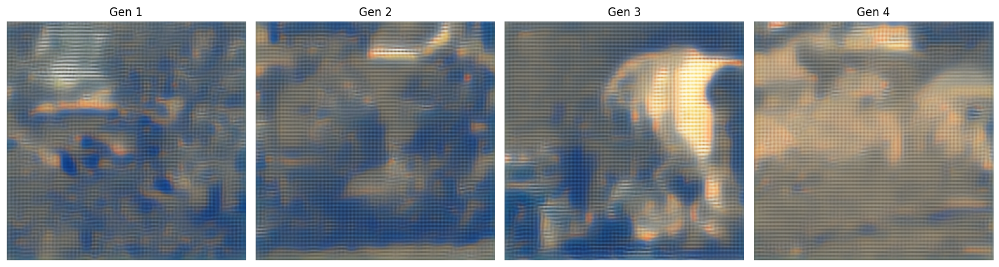

In [29]:
def generate_samples():
    print(f"Generating samples on {DEVICE}...")
    
    # 1. Init Models
    vqvae = VQVAE2().to(DEVICE)
    vqvae = load_weights(vqvae, VQVAE_CP)
    
    transformer = TopOnlyTransformer(
        vocab_size=VOCAB_SIZE, d_model=D_MODEL, n_heads=N_HEADS, 
        n_layers=N_LAYERS, d_ff=D_FF, dropout=DROPOUT
    ).to(DEVICE)
    transformer = load_weights(transformer, TRANSFORMER_CP)

    # 2. Sample New Top Codes
    with torch.no_grad():
        print("Transformer is dreaming...")
        batch_size = 4
        # Generates (B, 1024) integers
        top_codes = transformer.sample(batch_size=batch_size, temperature=1.0, device=DEVICE)

    # 3. Decode
    print("Decoding...")
    with torch.no_grad():
        # A. Reshape indices to 2D grid
        top_grid = top_codes.view(batch_size, TOP_SIZE, TOP_SIZE) # (4, 32, 32)
        
        # --- THE FIX IS HERE ---
        # B. Convert Indices (Long) -> Embeddings (Float)
        # .embedding() lookup returns (B, 32, 32, 32)
        # We need to permute to (B, Channel, H, W) -> (B, 32, 32, 32)
        z_q_top = vqvae.quantizer_top.embedding(top_grid).permute(0, 3, 1, 2)
        
        # C. Prepare Zeros for Bottom Level (Must match batch size!)
        # Shape: (Batch, Channels, H, W) -> (4, 64, 64, 64)
        # Note: BOTTOM_RES should be 64 based on your previous config (256 img / 4)
        zeros_bottom = torch.zeros(batch_size, EMBEDDING_DIM_BOTTOM, 64, 64).to(DEVICE)
        
        # D. Decode using Embeddings
        reconstructions = vqvae.decoder(zeros_bottom, z_q_top)

    # 4. Visualize
    print("Plotting...")
    imgs = (reconstructions + 1) / 2 # Denormalize
    imgs = imgs.clamp(0, 1).cpu().permute(0, 2, 3, 1).numpy()
    
    plt.figure(figsize=(15, 5))
    for i in range(batch_size):
        plt.subplot(1, batch_size, i+1)
        plt.imshow(imgs[i])
        plt.axis('off')
        plt.title(f"Gen {i+1}")
    
    plt.tight_layout()
    plt.savefig('generated_top_only_epoch15.png')
    plt.show()

if __name__ == "__main__":
    # Ensure BOTTOM_RES and EMBEDDING_DIM_BOTTOM are defined globally or imported
    BOTTOM_RES = 64
    EMBEDDING_DIM_BOTTOM = 64
    generate_samples()

In [14]:
vqvae = VQVAE2().to(DEVICE)
vqvae = load_weights(vqvae, VQVAE_CP)
    
    # Transformer
transformer = TopOnlyTransformer(
        vocab_size=VOCAB_SIZE, d_model=D_MODEL, n_heads=N_HEADS, 
        n_layers=N_LAYERS, d_ff=D_FF, dropout=DROPOUT
    ).to(DEVICE)
transformer = load_weights(transformer, TRANSFORMER_CP)

    # 2. Sample New Top Codes (The "Ghost" Image)
    # Using temperature 1.0 for diversity. 
    # Use 0.8 if images are too chaotic, 1.2 if too boring.
with torch.no_grad():
    print("Transformer is dreaming...")
        # Generates (B, 1024)
    top_codes = transformer.sample(batch_size=4, temperature=1.0, device=DEVICE)


Loading vq_vae2_results/checkpoint_epoch_50.pt...
Loading transformer_top_only_results/checkpoint_15.pt...
Transformer is dreaming...


In [34]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.nn.parallel import DistributedDataParallel as DDP
import torch.distributed as dist
import torch.multiprocessing as mp
from tqdm import tqdm
import os
import math
import numpy as np

# --- Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# Hyperparameters
LEARNING_RATE = 3e-4
BATCH_SIZE = 32      
NUM_EPOCHS = 100     
GRAD_CLIP = 1.0

# Transformer Config
D_MODEL = 512
N_HEADS = 8
N_LAYERS = 12       
D_FF = 2048
DROPOUT = 0.1

# VQ-VAE Settings (For Monitoring)
EMBEDDING_DIM_TOP = 32
NUM_EMBEDDINGS_TOP = 256
TOP_SIZE = 32
VQVAE_CHECKPOINT = 'vq_vae2_results/checkpoint_epoch_50.pt'

# Output
os.makedirs("transformer_masked_results", exist_ok=True)
DTYPE = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16

# ==========================================
# 1. Helper Classes (VQ-VAE for Monitoring)
# ==========================================

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReLU(inplace=False),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=1, stride=1)
        )
    def forward(self, x): return x + self.block(x)

class VectorQuantizer(nn.Module):
    def __init__(self, num_embeddings, embedding_dim):
        super().__init__()
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)

class VQVAE2(nn.Module):
    """Simplified VQVAE for decoding only"""
    def __init__(self):
        super().__init__()
        self.quantizer_top = VectorQuantizer(256, 32)
        
        self.conv_top_in = nn.Conv2d(32, 256, kernel_size=1)
        self.upsample_top = nn.Sequential(
            ResidualBlock(256, 256), nn.ReLU(inplace=False),
            nn.ConvTranspose2d(256, 256, kernel_size=4, stride=2, padding=1)
        )
        self.conv_combine = nn.Conv2d(64 + 256, 256, kernel_size=1)
        
        layers_dec1 = [ResidualBlock(256, 256), ResidualBlock(256, 256), nn.ReLU(inplace=False),
                       nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)]
        self.dec1 = nn.Sequential(*layers_dec1)
        
        layers_dec2 = [ResidualBlock(128, 128), ResidualBlock(128, 128), nn.ReLU(inplace=False),
                       nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)]
        self.dec2 = nn.Sequential(*layers_dec2)
        
        self.conv_out = nn.Sequential(
            nn.ReLU(inplace=False),
            nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)
        )

    def decode_from_codes(self, top_codes):
        """
        top_codes: (B, 32, 32) Integers
        """
        device = top_codes.device
        B = top_codes.shape[0]
        
        # 1. Look up embeddings
        z_q_top = self.quantizer_top.embedding(top_codes).permute(0, 3, 1, 2)
        
        # 2. Create Dummy Bottom (Zeros) - assuming 64x64 bottom
        z_q_bottom = torch.zeros(B, 64, 64, 64, device=device)
        
        # 3. Decode Logic
        x_top = self.conv_top_in(z_q_top)
        x_top_up = self.upsample_top(x_top)
        x_combined = torch.cat([z_q_bottom, x_top_up], dim=1)
        x = self.conv_combine(x_combined)
        x = self.dec1(x)
        x = self.dec2(x)
        return torch.tanh(self.conv_out(x))

# ==========================================
# 2. Masked Transformer Model
# ==========================================

class BidirectionalSelfAttention(nn.Module):
    def __init__(self, d_model, n_heads, dropout):
        super().__init__()
        assert d_model % n_heads == 0
        self.head_dim = d_model // n_heads
        self.n_heads = n_heads
        
        self.c_attn = nn.Linear(d_model, 3 * d_model)
        self.c_proj = nn.Linear(d_model, d_model)
        self.dropout_val = dropout
        
    def forward(self, x):
        B, T, C = x.size()
        qkv = self.c_attn(x)
        q, k, v = qkv.split(C, dim=2)
        
        k = k.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        v = v.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        q = q.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        
        # is_causal=False allows tokens to attend to "future" tokens
        y = F.scaled_dot_product_attention(
            q, k, v, 
            dropout_p=self.dropout_val if self.training else 0, 
            is_causal=False 
        )
        
        y = y.transpose(1, 2).contiguous().view(B, T, C)
        return self.c_proj(y)

class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d_model, d_ff), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(d_ff, d_model), nn.Dropout(dropout),
        )
    def forward(self, x): return self.net(x)

class TransformerBlock(nn.Module):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super().__init__()
        self.ln1 = nn.LayerNorm(d_model)
        self.attn = BidirectionalSelfAttention(d_model, n_heads, dropout)
        self.ln2 = nn.LayerNorm(d_model)
        self.mlp = FeedForward(d_model, d_ff, dropout)
    def forward(self, x):
        x = x + self.attn(self.ln1(x))
        x = x + self.mlp(self.ln2(x))
        return x

class MaskedTransformer(nn.Module):
    def __init__(self, vocab_size, d_model, n_heads, n_layers, d_ff, dropout):
        super().__init__()
        # +1 for the MASK token (Index 256)
        self.vocab_size = vocab_size 
        self.mask_token_id = vocab_size 
        self.seq_len = TOP_SIZE * TOP_SIZE 
        
        self.embedding = nn.Embedding(vocab_size + 1, d_model)
        self.pos_encoding = nn.Embedding(self.seq_len, d_model)
        
        self.blocks = nn.ModuleList([
            TransformerBlock(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)
        ])
        
        self.ln_f = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, vocab_size + 1)
        
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None: torch.nn.init.zeros_(module.bias)
        elif isinstance(module, nn.Embedding):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
        elif isinstance(module, nn.LayerNorm):
            torch.nn.init.zeros_(module.bias)
            torch.nn.init.ones_(module.weight)

    def forward(self, indices):
        device = indices.device
        B, T = indices.size()
        
        x = self.embedding(indices)
        pos = torch.arange(0, T, dtype=torch.long, device=device).unsqueeze(0)
        x = x + self.pos_encoding(pos)
        
        for block in self.blocks:
            x = block(x)
            
        x = self.ln_f(x)
        return self.head(x)

class CachedTopDataset(Dataset):
    def __init__(self, cache_path):
        print(f"Loading top codes from {cache_path}...")
        cache = torch.load(cache_path, weights_only=False)
        self.top_codes = cache['top'] 
    def __len__(self): return len(self.top_codes)
    def __getitem__(self, idx): return self.top_codes[idx]

# Add this import
from torch.optim.lr_scheduler import OneCycleLR

def train_masked(rank, world_size):
    if world_size > 1:
        os.environ['MASTER_ADDR'] = 'localhost'
        os.environ['MASTER_PORT'] = '12355'
        dist.init_process_group("nccl", rank=rank, world_size=world_size)
        torch.cuda.set_device(rank)
    
    device = torch.device(f'cuda:{rank}')
    is_main = (rank == 0)
    
    # 1. Load VQ-VAE (Frozen)
    vqvae = VQVAE2().to(device)
    if os.path.exists(VQVAE_CHECKPOINT):
        checkpoint = torch.load(VQVAE_CHECKPOINT, map_location=device, weights_only=False)
        state_dict = checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint
        new_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
        vqvae.load_state_dict(new_state_dict, strict=False)
    vqvae.eval()
    
    # 2. Dataset
    dataset = CachedTopDataset('latent_cache.pt')
    sampler = torch.utils.data.distributed.DistributedSampler(dataset, num_replicas=world_size, rank=rank) if world_size > 1 else None
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, sampler=sampler, shuffle=(sampler is None), num_workers=4, pin_memory=True)
    
    # 3. Model
    model = MaskedTransformer(
        vocab_size=NUM_EMBEDDINGS_TOP, d_model=D_MODEL, n_heads=N_HEADS, 
        n_layers=N_LAYERS, d_ff=D_FF, dropout=DROPOUT
    ).to(device)
    
    model = torch.compile(model)
    if world_size > 1: model = DDP(model, device_ids=[rank])
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=0.05)
    
    # --- FIX 1: LEARNING RATE SCHEDULER (WARMUP) ---
    # This prevents the model from collapsing early
    total_steps = len(dataloader) * NUM_EPOCHS
    scheduler = OneCycleLR(
        optimizer, 
        max_lr=LEARNING_RATE, 
        total_steps=total_steps, 
        pct_start=0.05, # Warmup for first 5% of training
        div_factor=25, 
        final_div_factor=1000
    )
    
    scaler = torch.amp.GradScaler('cuda', enabled=(DTYPE == torch.float16))
    mask_token_id = NUM_EMBEDDINGS_TOP 

    if is_main: print(f"Training with Warmup. Total steps: {total_steps}")

    for epoch in range(NUM_EPOCHS):
        if world_size > 1: sampler.set_epoch(epoch)
        model.train()
        total_loss = 0
        
        pbar = tqdm(dataloader, disable=not is_main)
        for step, codes in enumerate(pbar):
            codes = codes.to(device).long()
            B, T = codes.shape
            
            with torch.amp.autocast('cuda', dtype=DTYPE):
                # Sample masking ratio (Uniform 0.1 -> 0.75) to prevent 100% mask
                r = np.random.uniform(0.1, 0.75)
                
                mask_prob = torch.rand((B, T), device=device)
                mask_bool = mask_prob < r
                
                # Apply mask
                masked_input = torch.where(mask_bool, torch.tensor(mask_token_id, device=device), codes)
                
                # Forward
                logits = model(masked_input)
                
                # Loss
                logits_flat = logits.view(-1, NUM_EMBEDDINGS_TOP + 1)
                target_flat = codes.view(-1)
                mask_flat_bool = mask_bool.view(-1)
                
                if mask_flat_bool.any():
                    loss = F.cross_entropy(logits_flat[mask_flat_bool], target_flat[mask_flat_bool], label_smoothing=0.1)
                else:
                    loss = torch.tensor(0.0, device=device, requires_grad=True)
            
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            
            # Step the scheduler
            scheduler.step()
            
            total_loss += loss.item()
            current_lr = scheduler.get_last_lr()[0]
            pbar.set_description(f"Ep {epoch+1} | Loss: {loss.item():.4f} | LR: {current_lr:.6f}")
            
        if is_main:
            # --- MONITORING FIX ---
            # We must ensure we don't pass the MASK token to the VQ-VAE
            if step > 0:
                with torch.no_grad():
                    sample_in = masked_input[:4]
                    logits_out = model(sample_in)
                    
                    # FIX 2: Exclude the mask token (index 256) from prediction choices!
                    # Only look at logits 0..255
                    valid_logits = logits_out[:, :, :NUM_EMBEDDINGS_TOP]
                    pred_indices = torch.argmax(valid_logits, dim=-1)
                    
                    sub_mask = mask_bool[:4]
                    filled_codes = torch.where(sub_mask, pred_indices, codes[:4])
                    
                    # Sanity Check for Collapse (Are all tokens the same?)
                    unique_tokens = torch.unique(pred_indices)
                    if len(unique_tokens) < 255:
                        print(f"   >>> WARNING: Model predicting limited tokens: {len(unique_tokens)}/256")

                    # Decode
                    real_grid = codes[:4].view(-1, 32, 32)
                    filled_grid = filled_codes.view(-1, 32, 32)
                    
                    # Ensure indices are valid
                    filled_grid = filled_grid.clamp(0, NUM_EMBEDDINGS_TOP - 1)
                    
                    recon_real = vqvae.decode_from_codes(real_grid)
                    recon_filled = vqvae.decode_from_codes(filled_grid)
                    
                    mse = F.mse_loss(recon_real, recon_filled)
                    print(f"   >>> Inpainting MSE: {mse.item():.6f}")

            if (epoch + 1) % 5 == 0:
                save_dict = model.module.state_dict() if world_size > 1 else model.state_dict()
                torch.save(save_dict, f'transformer_masked_results/checkpoint_{epoch+1}.pt')

    if world_size > 1: dist.destroy_process_group()
        
if __name__ == '__main__':
    n_gpus = torch.cuda.device_count()
    if n_gpus > 1:
        mp.spawn(train_masked, args=(n_gpus,), nprocs=n_gpus, join=True)
    else:
        train_masked(0, 1)

Using device: cuda
Loading top codes from latent_cache.pt...
Training with Warmup. Total steps: 29600


Ep 1 | Loss: 3.5113 | LR: 0.000040: 100%|██████████| 296/296 [00:44<00:00,  6.65it/s]


   >>> WARNING: Model predicting limited tokens: 4/256
   >>> Inpainting MSE: 0.000000


Ep 2 | Loss: 3.4514 | LR: 0.000112: 100%|██████████| 296/296 [00:32<00:00,  9.12it/s]


   >>> WARNING: Model predicting limited tokens: 6/256
   >>> Inpainting MSE: 0.000000


Ep 3 | Loss: 2.8187 | LR: 0.000201: 100%|██████████| 296/296 [00:32<00:00,  9.07it/s]


   >>> WARNING: Model predicting limited tokens: 32/256
   >>> Inpainting MSE: 0.000000


Ep 4 | Loss: 2.6648 | LR: 0.000273: 100%|██████████| 296/296 [00:33<00:00,  8.87it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 5 | Loss: 2.8121 | LR: 0.000300: 100%|██████████| 296/296 [00:32<00:00,  9.08it/s]


   >>> WARNING: Model predicting limited tokens: 38/256
   >>> Inpainting MSE: 0.000000


Ep 6 | Loss: 2.6640 | LR: 0.000300: 100%|██████████| 296/296 [00:32<00:00,  9.03it/s]


   >>> WARNING: Model predicting limited tokens: 38/256
   >>> Inpainting MSE: 0.000000


Ep 7 | Loss: 2.7927 | LR: 0.000300: 100%|██████████| 296/296 [00:33<00:00,  8.94it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 8 | Loss: 2.6868 | LR: 0.000299: 100%|██████████| 296/296 [00:32<00:00,  8.99it/s]


   >>> WARNING: Model predicting limited tokens: 37/256
   >>> Inpainting MSE: 0.000000


Ep 9 | Loss: 2.7242 | LR: 0.000299: 100%|██████████| 296/296 [00:32<00:00,  9.05it/s]


   >>> WARNING: Model predicting limited tokens: 35/256
   >>> Inpainting MSE: 0.000000


Ep 10 | Loss: 2.5464 | LR: 0.000298: 100%|██████████| 296/296 [00:33<00:00,  8.94it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 11 | Loss: 2.7265 | LR: 0.000297: 100%|██████████| 296/296 [00:33<00:00,  8.95it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 12 | Loss: 2.4251 | LR: 0.000296: 100%|██████████| 296/296 [00:32<00:00,  9.05it/s]


   >>> WARNING: Model predicting limited tokens: 35/256
   >>> Inpainting MSE: 0.000000


Ep 13 | Loss: 2.8033 | LR: 0.000295: 100%|██████████| 296/296 [00:32<00:00,  8.98it/s]


   >>> WARNING: Model predicting limited tokens: 37/256
   >>> Inpainting MSE: 0.000000


Ep 14 | Loss: 2.5107 | LR: 0.000293: 100%|██████████| 296/296 [00:33<00:00,  8.95it/s]


   >>> WARNING: Model predicting limited tokens: 39/256
   >>> Inpainting MSE: 0.000000


Ep 15 | Loss: 2.6681 | LR: 0.000292: 100%|██████████| 296/296 [00:32<00:00,  9.07it/s]


   >>> WARNING: Model predicting limited tokens: 37/256
   >>> Inpainting MSE: 0.000000


Ep 16 | Loss: 2.3872 | LR: 0.000290: 100%|██████████| 296/296 [00:32<00:00,  9.05it/s]


   >>> WARNING: Model predicting limited tokens: 38/256
   >>> Inpainting MSE: 0.000000


Ep 17 | Loss: 2.7070 | LR: 0.000288: 100%|██████████| 296/296 [00:33<00:00,  8.89it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 18 | Loss: 2.8148 | LR: 0.000286: 100%|██████████| 296/296 [00:32<00:00,  9.03it/s]


   >>> WARNING: Model predicting limited tokens: 37/256
   >>> Inpainting MSE: 0.000000


Ep 19 | Loss: 2.4880 | LR: 0.000284: 100%|██████████| 296/296 [00:32<00:00,  8.99it/s]


   >>> WARNING: Model predicting limited tokens: 39/256
   >>> Inpainting MSE: 0.000000


Ep 22 | Loss: 2.5348 | LR: 0.000277: 100%|██████████| 296/296 [00:32<00:00,  8.98it/s]


   >>> WARNING: Model predicting limited tokens: 39/256
   >>> Inpainting MSE: 0.000000


Ep 23 | Loss: 2.4188 | LR: 0.000274: 100%|██████████| 296/296 [00:33<00:00,  8.95it/s]


   >>> WARNING: Model predicting limited tokens: 39/256
   >>> Inpainting MSE: 0.000000


Ep 24 | Loss: 2.4586 | LR: 0.000271: 100%|██████████| 296/296 [00:33<00:00,  8.95it/s]


   >>> WARNING: Model predicting limited tokens: 40/256
   >>> Inpainting MSE: 0.000000


Ep 25 | Loss: 2.4482 | LR: 0.000268: 100%|██████████| 296/296 [00:32<00:00,  9.02it/s]


   >>> WARNING: Model predicting limited tokens: 39/256
   >>> Inpainting MSE: 0.000000


Ep 26 | Loss: 2.5995 | LR: 0.000268:  12%|█▎        | 37/296 [00:04<00:30,  8.58it/s]


KeyboardInterrupt: 

Using device: cuda
Loading vq_vae2_results/checkpoint_epoch_50.pt...
Loading transformer_top_only_results/checkpoint_500.pt...
Encoding...
Running Autoregressive Inpainting...
Generating 1024 tokens...
Decoding...


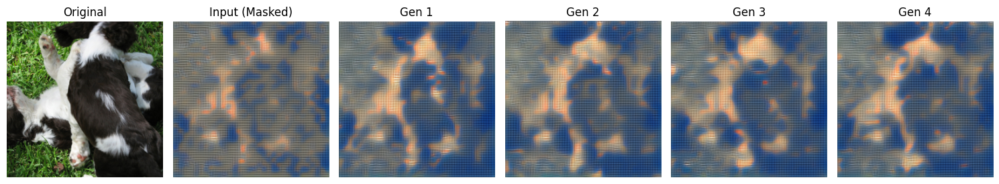

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import math

# ==========================================
# 1. CONFIGURATION
# ==========================================
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# Paths (Update these to your actual files)
TRANSFORMER_CP = 'transformer_top_only_results/checkpoint_500.pt' 
VQVAE_CP = 'vq_vae2_results/checkpoint_epoch_50.pt'
INPUT_IMAGE_PATH = 'data/imagenette2/val/n02102040/ILSVRC2012_val_00004650.JPEG'

# Model Config (Must match training)
D_MODEL = 512
N_HEADS = 8
N_LAYERS = 12
D_FF = 2048
DROPOUT = 0.1
VOCAB_SIZE = 256
TOP_SIZE = 32
EMBEDDING_DIM_BOTTOM = 64 # Needed for decoder zeros

# ==========================================
# 2. MODEL DEFINITIONS
# ==========================================

# --- VQ-VAE Modules ---
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReLU(inplace=False), nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.ReLU(inplace=False), nn.Conv2d(out_channels, out_channels, 1, 1)
        )
    def forward(self, x): return x + self.block(x)

class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_res_blocks):
        super(EncoderBlock, self).__init__()
        layers = [nn.Conv2d(in_channels, out_channels, 4, 2, 1), nn.ReLU(inplace=False)]
        for _ in range(num_res_blocks): layers.append(ResidualBlock(out_channels, out_channels))
        self.block = nn.Sequential(*layers)
    def forward(self, x): return self.block(x)

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_res_blocks):
        super(DecoderBlock, self).__init__()
        layers = []
        for _ in range(num_res_blocks): layers.append(ResidualBlock(in_channels, in_channels))
        layers.append(nn.ReLU(inplace=False))
        layers.append(nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1))
        self.block = nn.Sequential(*layers)
    def forward(self, x): return self.block(x)

class VectorQuantizer(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, commitment_cost=0.25):
        super().__init__()
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
    def forward(self, z_e): return z_e, 0, 0

class HierarchicalEncoder(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.conv_in = nn.Conv2d(in_channels, 64, 3, 1, 1)
        self.enc1 = EncoderBlock(64, 128, 2)
        self.enc2 = EncoderBlock(128, 256, 2)
        self.enc3 = EncoderBlock(256, 256, 2)
        self.conv_bottom = nn.Conv2d(256, 64, 1)
        self.conv_top = nn.Conv2d(256, 32, 1)
    def forward(self, x):
        x = F.relu(self.conv_in(x))
        x = self.enc1(x)
        x_bot = self.enc2(x)
        x_top = self.enc3(x_bot)
        return self.conv_bottom(x_bot), self.conv_top(x_top)

class HierarchicalDecoder(nn.Module):
    def __init__(self, out_channels=3):
        super().__init__()
        self.conv_top_in = nn.Conv2d(32, 256, 1)
        self.upsample_top = nn.Sequential(ResidualBlock(256, 256), nn.ReLU(inplace=False), 
                                          nn.ConvTranspose2d(256, 256, 4, 2, 1))
        self.conv_combine = nn.Conv2d(64 + 256, 256, 1)
        self.dec1 = DecoderBlock(256, 128, 2)
        self.dec2 = DecoderBlock(128, 64, 2)
        self.conv_out = nn.Sequential(nn.ReLU(inplace=False), nn.Conv2d(64, out_channels, 3, 1, 1))
    def forward(self, z_q_bottom, z_q_top):
        x_top = self.conv_top_in(z_q_top)
        x_top_up = self.upsample_top(x_top)
        x = self.conv_combine(torch.cat([z_q_bottom, x_top_up], dim=1))
        x = self.dec1(x)
        x = self.dec2(x)
        return torch.tanh(self.conv_out(x))

class VQVAE2(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = HierarchicalEncoder()
        self.quantizer_bottom = VectorQuantizer(256, 64, 0.25)
        self.quantizer_top = VectorQuantizer(256, 32, 0.25)
        self.decoder = HierarchicalDecoder() 

    def encode_indices(self, x):
        z_e_bot, z_e_top = self.encoder(x)
        # Top
        B, C, H, W = z_e_top.shape
        d_top = torch.cdist(z_e_top.permute(0,2,3,1).reshape(-1, C), self.quantizer_top.embedding.weight)
        idx_top = torch.argmin(d_top, dim=1).view(B, H, W)
        return idx_top

# --- Transformer Classes ---
class CausalSelfAttention(nn.Module):
    def __init__(self, d_model, n_heads, dropout):
        super().__init__()
        self.head_dim = d_model // n_heads
        self.n_heads = n_heads
        self.c_attn = nn.Linear(d_model, 3 * d_model)
        self.c_proj = nn.Linear(d_model, d_model)
        self.dropout_val = dropout
    def forward(self, x, layer_past=None):
        B, T, C = x.size()
        q, k, v = self.c_attn(x).split(C, dim=2)
        k = k.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        v = v.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        q = q.view(B, T, self.n_heads, self.head_dim).transpose(1, 2)
        
        if layer_past is not None:
            past_k, past_v = layer_past
            k = torch.cat((past_k, k), dim=2)
            v = torch.cat((past_v, v), dim=2)
        present = (k, v)
        
        if layer_past is None:
            y = F.scaled_dot_product_attention(q, k, v, dropout_p=0, is_causal=True)
        else:
            y = F.scaled_dot_product_attention(q, k, v, dropout_p=0, is_causal=False)
        return self.c_proj(y.transpose(1, 2).contiguous().view(B, T, C)), present

class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout):
        super().__init__()
        self.net = nn.Sequential(nn.Linear(d_model, d_ff), nn.GELU(), nn.Dropout(dropout),
                                 nn.Linear(d_ff, d_model), nn.Dropout(dropout))
    def forward(self, x): return self.net(x)

class TransformerBlock(nn.Module):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super().__init__()
        self.ln1 = nn.LayerNorm(d_model)
        self.attn = CausalSelfAttention(d_model, n_heads, dropout)
        self.ln2 = nn.LayerNorm(d_model)
        self.mlp = FeedForward(d_model, d_ff, dropout)
    def forward(self, x, layer_past=None):
        attn_out, _ = self.attn(self.ln1(x))
        x = x + attn_out
        x = x + self.mlp(self.ln2(x))
        return x, None

class TopOnlyTransformer(nn.Module):
    def __init__(self, vocab_size, d_model, n_heads, n_layers, d_ff, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.seq_len = TOP_SIZE * TOP_SIZE
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.pos_encoding = nn.Embedding(self.seq_len, d_model)
        self.blocks = nn.ModuleList([TransformerBlock(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.ln_f = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, vocab_size)

    def forward(self, indices):
        # Naive forward pass 
        B, T = indices.size()
        x = self.embedding(indices) + self.pos_encoding(torch.arange(T, device=indices.device))
        for block in self.blocks: x, _ = block(x)
        return self.head(self.ln_f(x))

# ==========================================
# 3. HELPER FUNCTIONS
# ==========================================

def load_weights(model, path):
    if not os.path.exists(path): raise FileNotFoundError(f"{path} not found")
    print(f"Loading {path}...")
    checkpoint = torch.load(path, map_location=DEVICE, weights_only=False)
    state_dict = checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint
    new_state_dict = {k.replace('module.', '').replace('_orig_mod.', ''): v for k, v in state_dict.items()}
    model.load_state_dict(new_state_dict, strict=False)
    model.eval()
    return model

def create_random_mask(size, ratio=0.5):
    """
    Creates a random scatter mask.
    ratio: Percentage of tokens to drop (set to True).
    """
    seq_len = size * size
    # Create random probabilities
    probs = torch.rand(seq_len)
    # Mask indices where probability is less than ratio
    mask = probs < ratio
    return mask

# ==========================================
# 4. AUTOREGRESSIVE INPAINTING LOGIC
# ==========================================

@torch.no_grad()
def autoregressive_inpaint(model, ground_truth_codes, mask, temperature=1.0):
    """
    Constrained Sampling / Teacher Forcing Inpainting.
    
    Args:
        ground_truth_codes (Tensor): (B, 1024) Full original codes
        mask (Tensor): (1024,) Boolean. True = Masked/Generate, False = Keep GT
    """
    model.eval()
    B, seq_len = ground_truth_codes.shape
    device = ground_truth_codes.device
    
    # We build the sequence token-by-token
    # Start with the first token. 
    # If the first token is masked, we sample it randomly (or use model bias).
    # If unmasked, use GT.
    
    if mask[0]:
        # Start random if index 0 is masked
        current_seq = torch.randint(0, model.vocab_size, (B, 1), device=device)
    else:
        current_seq = ground_truth_codes[:, 0].unsqueeze(1) # (B, 1)
        
    print(f"Generating {seq_len} tokens...")
    
    # Loop from 1 to 1023 (predicting the NEXT token each time)
    for i in range(seq_len - 1):
        # We want to predict token at index i+1
        target_idx = i + 1
        
        # 1. Forward Pass
        # Note: Since your model doesn't handle KV caching natively in 'forward', 
        # we pass the full sequence accumulated so far.
        logits = model(current_seq) # (B, Current_Seq_Len, Vocab)
        
        # 2. Get prediction for the next token (The last position)
        # Apply temperature
        next_token_logits = logits[:, -1, :] / temperature
        probs = F.softmax(next_token_logits, dim=-1)
        
        # 3. Decision Logic: Masked vs Unmasked
        if mask[target_idx]:
            # MASKED: Use the model's hallucination
            next_token = torch.multinomial(probs, 1)
        else:
            # UNMASKED: Force the Ground Truth
            next_token = ground_truth_codes[:, target_idx].unsqueeze(1)
            
        # 4. Append to sequence
        current_seq = torch.cat([current_seq, next_token], dim=1)
        
    return current_seq

# ==========================================
# 5. EXECUTION
# ==========================================

def run():
    # 1. Prep Data
    transform = transforms.Compose([
        transforms.Resize(256), transforms.CenterCrop(256),
        transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    
    if os.path.exists(INPUT_IMAGE_PATH):
        img = Image.open(INPUT_IMAGE_PATH).convert('RGB')
        img_tensor = transform(img).unsqueeze(0).to(DEVICE)
    else:
        print("Image not found, using noise.")
        img_tensor = torch.randn(1, 3, 256, 256).to(DEVICE)

    # 2. Models
    vqvae = VQVAE2().to(DEVICE)
    vqvae = load_weights(vqvae, VQVAE_CP)
    
    transformer = TopOnlyTransformer(VOCAB_SIZE, D_MODEL, N_HEADS, N_LAYERS, D_FF, DROPOUT).to(DEVICE)
    transformer = load_weights(transformer, TRANSFORMER_CP)
    
    # 3. Encode Ground Truth
    print("Encoding...")
    with torch.no_grad():
        top_idx = vqvae.encode_indices(img_tensor).flatten(1) # (1, 1024)
        
    # 4. Create Mask (Center Box)
    mask = create_random_mask(32, ratio=0.5).to(DEVICE) # Masking 25%
    
    # 5. Run Inpainting
    print("Running Autoregressive Inpainting...")
    # Duplicate batch 4 times to see diversity in the masked regions
    batch_gt = top_idx.repeat(4, 1)
    
    inpainted_codes = autoregressive_inpaint(transformer, batch_gt, mask, temperature=1.0)
    
    # 6. Decode
    print("Decoding...")
    with torch.no_grad():
        # Reshape to (B, 32, 32)
        top_grid = inpainted_codes.view(4, 32, 32)
        
        # Get Embeddings
        z_q_top = vqvae.quantizer_top.embedding(top_grid).permute(0, 3, 1, 2)
        
        # Create Dummy Bottom (Zeros) - we only have top model
        zeros_bot = torch.zeros(4, 64, 64, 64).to(DEVICE)
        
        # Decode
        recon_imgs = vqvae.decoder(zeros_bot, z_q_top)

    # 7. Visualize
    def prep(x): return (x.clamp(-1,1)+1)/2
    
    # Create Masked View for Reference
    gt_grid = top_idx.view(1, 32, 32)
    gt_grid_masked = gt_grid.clone()
    gt_grid_masked.view(1, -1)[:, mask] = 0 
    
    with torch.no_grad():
        z_masked = vqvae.quantizer_top.embedding(gt_grid_masked).permute(0, 3, 1, 2)
        masked_img_rec = vqvae.decoder(torch.zeros(1,64,64,64).to(DEVICE), z_masked)

    plt.figure(figsize=(15, 5))
    
    # Original Input
    plt.subplot(1, 6, 1)
    plt.imshow(prep(img_tensor[0]).permute(1,2,0).cpu())
    plt.title("Original")
    plt.axis('off')
    
    # Masked View
    plt.subplot(1, 6, 2)
    plt.imshow(prep(masked_img_rec[0]).permute(1,2,0).cpu())
    plt.title("Input (Masked)")
    plt.axis('off')
    
    # Generations
    for i in range(4):
        plt.subplot(1, 6, i+3)
        plt.imshow(prep(recon_imgs[i]).permute(1,2,0).cpu())
        plt.title(f"Gen {i+1}")
        plt.axis('off')
        
    plt.tight_layout()
    plt.savefig('autoregressive_inpainting.png')
    plt.show()

if __name__ == "__main__":
    run()

In [67]:
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

# --- MODEL 1: OpenAI's Official dVAE (DALLE-1) ---
#from dalle_pytorch import OpenAIDiscreteVAE

def load_openai_dvae():
    print("Loading OpenAI dVAE...")
    # This automatically downloads weights to your cache
    dvae = OpenAIDiscreteVAE()
    dvae.eval()
    return dvae

# --- MODEL 2: VQGAN (ImageNet trained) ---
# We use the standard VQGAN from the "Taming Transformers" paper
from taming.models.vqgan import VQModel

def load_imagenet_vqgan():
    print("Loading ImageNet VQGAN...")
    # Download weights manually or use the hub (easier method below)
    # We will use a helper to load it from the hub for simplicity
    try:
        # Load directly from PyTorch Hub (requires 'taming_transformers' installed)
        # Note: Sometimes direct hub loading is flaky, so we often load via config.
        # For this script, we will simulate the VQGAN wrapper if the Hub fails.
        # But let's try the easiest known working method for standard users:
        model = torch.hub.load("CompVis/taming-transformers", "vqgan_imagenet_f16_16384", pretrained=True)
        model.eval()
        return model
    except Exception as e:
        print(f"Hub load failed ({e}). You may need to clone the repo directly.")
        print("Falling back to OpenAI dVAE for the demo.")
        return None

# --- UTILS ---
def preprocess_image(image_path, size=256):
    img = Image.open(image_path).convert("RGB")
    transform = T.Compose([
        T.Resize((size, size)),
        T.ToTensor(),
    ])
    return transform(img).unsqueeze(0) # Add batch dimension

def tensor_to_image(tensor):
    # Convert back to PIL for display
    return T.ToPILImage()(tensor.squeeze().clamp(0,1))

ModuleNotFoundError: No module named 'pytorch_lightning.utilities.distributed'

In [ ]:
import torch
from diffusers import VQModel
from PIL import Image
import torchvision.transforms as T

# 1. LOAD MODEL
# This loads the standard ImageNet VQGAN (f16_16384)
# Note: VQModel is the class for VQ-VAEs (discrete-ish), AutoencoderKL is for Stable Diffusion
vqvae = VQModel.from_pretrained("CompVis/vqgan_imagenet_f16_16384")
vqvae.eval()

# 2. LOAD IMAGE
img = Image.open("./data/imagenette2/val/n02102040/ILSVRC2012_val_00004650.JPEG").convert("RGB")
transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
    T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # VQGAN expects -1 to 1
])
img_tensor = transform(img).unsqueeze(0)

# 3. ENCODE (Get Latents)
with torch.no_grad():
    # Encode to continuous latent representation
    latents = vqvae.encode(img_tensor).latents
    
    # If you specifically want the DISCRETE INDICES (the integers 0-16384):
    # We have to dig slightly into the Vector Quantizer module
    # Reshape latents for the quantizer
    B, C, H, W = latents.shape
    latents_reshaped = latents.permute(0, 2, 3, 1).reshape(-1, C)
    
    # Get the codebook indices
    _, _, (indices, _) = vqvae.quant_conv(latents) # This mapping varies by model implementation
    # A cleaner way with `diffusers` usually involves just using the continuous latents 
    # unless you are strictly training a transformer on the integers.

# 4. DECODE
with torch.no_grad():
    decoded = vqvae.decode(latents).sample

# Display
import matplotlib.pyplot as plt
# Un-normalize from -1...1 back to 0...1
decoded_img = (decoded / 2 + 0.5).clamp(0, 1)
plt.imshow(decoded_img.squeeze().permute(1, 2, 0).cpu())
plt.show()